In [1]:
import project_utils as u
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Matplotlib created a temporary cache directory at /tmp/matplotlib-u4y2kyf3 because the default path (/home/jovyan/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


# 0. Links


1. https://www.irs.gov/statistics/soi-tax-stats-annual-extract-of-tax-exempt-organization-financial-data

1a. https://www.irs.gov/pub/irs-tege/2022schedulejform990annotated.pdf

1b. https://www.irs.gov/pub/irs-tege/2022form990withfieldnames.pdf

2. https://data.cms.gov/provider-data/archived-data/hospitals

2a. https://data.cms.gov/provider-data/topics/hospitals


Hospital systems: 
https://www.ahrq.gov/chsp/data-resources/compendium-2022.html (NEED TO DOWNLOAD THIS MANUALLY)


state to region map
https://www.kaggle.com/datasets/omer2040/usa-states-to-region



# 1. Set Constants

In [2]:
FORM_990_EXTRACT_PATH = "./data/form_990/"
FORM_990_ZIP_PATH = "./load/form_990/"
FORM_990_PROCESSED_PATH = "./processed/form_990/"

CMS_YEAR = 2022
CMS_DATASET_ID = f"hospitals_10_2022"
CMS_URL = f'https://data.cms.gov/provider-data/sites/default/files/archive/Hospitals/{CMS_YEAR}/{CMS_DATASET_ID}.zip'
CMS_ZIP_PATH = f"./load/hospitals/"
CMS_EXTRACT_PATH = f"data/hospitals/"

COM_INSIGHT_URL = 'https://www.communitybenefitinsight.org/api/get_hospitals.php'

COST_REPORT_PATH = './data/cost_report/'

TAX_YEAR = 2022
MIN_HOSPITAL_REV = 250_000_000
MAX_HOSPITAL_REV = 500_000_000

INCENTIVE_PERC_LIMIT = 1000000000000



FORM_990_BASE_URL = "https://apps.irs.gov/pub/epostcard/990/xml"
FORM_990_URLS = []

FORM_990_URLS.append(os.path.join(FORM_990_BASE_URL, "2022", "2022_TEOS_XML_01A.zip"))

# uncomment to download additional years
# WARNING: This will take 10s of GB

for i in range(1, 13):
# for i in range(1, 3):
    if i < 10:
        idx_name = f"0{i}"
    else:
        idx_name = str(i)
    FORM_990_URLS.append(os.path.join(FORM_990_BASE_URL, "2023", f"2023_TEOS_XML_{idx_name}A.zip"))
    FORM_990_URLS.append(os.path.join(FORM_990_BASE_URL, "2024", f"2024_TEOS_XML_{idx_name}A.zip"))
    # if i <= 7:
        # FORM_990_URLS.append(os.path.join(FORM_990_BASE_URL, "2025", f"2025_TEOS_XML_{idx_name}A.zip"))


# 2. Data Ingestion

In [3]:
FORM_990_URLS

['https://apps.irs.gov/pub/epostcard/990/xml/2022/2022_TEOS_XML_01A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2023/2023_TEOS_XML_01A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2024/2024_TEOS_XML_01A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2023/2023_TEOS_XML_02A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2024/2024_TEOS_XML_02A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2023/2023_TEOS_XML_03A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2024/2024_TEOS_XML_03A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2023/2023_TEOS_XML_04A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2024/2024_TEOS_XML_04A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2023/2023_TEOS_XML_05A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2024/2024_TEOS_XML_05A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2023/2023_TEOS_XML_06A.zip',
 'https://apps.irs.gov/pub/epostcard/990/xml/2024/2024_TEOS_XML_06A.zip',
 'https://apps.irs.gov/pub/epostcard/9

In [4]:
u.download_990s(FORM_990_URLS, FORM_990_ZIP_PATH, FORM_990_EXTRACT_PATH)
cms_root_path = u.get_cms_data(CMS_URL, CMS_ZIP_PATH, CMS_EXTRACT_PATH, CMS_DATASET_ID)
bridge = u.get_bridge_file()
u.download_cost_report(COST_REPORT_PATH)

https://apps.irs.gov/pub/epostcard/990/xml/2022/2022_TEOS_XML_01A.zip already saved at ./data/form_990/2022/01. Skipping...
https://apps.irs.gov/pub/epostcard/990/xml/2023/2023_TEOS_XML_01A.zip already saved at ./data/form_990/2023/01. Skipping...
https://apps.irs.gov/pub/epostcard/990/xml/2024/2024_TEOS_XML_01A.zip already saved at ./data/form_990/2024/01. Skipping...
https://apps.irs.gov/pub/epostcard/990/xml/2023/2023_TEOS_XML_02A.zip already saved at ./data/form_990/2023/02. Skipping...
https://apps.irs.gov/pub/epostcard/990/xml/2024/2024_TEOS_XML_02A.zip already saved at ./data/form_990/2024/02. Skipping...
https://apps.irs.gov/pub/epostcard/990/xml/2023/2023_TEOS_XML_03A.zip already saved at ./data/form_990/2023/03. Skipping...
https://apps.irs.gov/pub/epostcard/990/xml/2024/2024_TEOS_XML_03A.zip already saved at ./data/form_990/2024/03. Skipping...
https://apps.irs.gov/pub/epostcard/990/xml/2023/2023_TEOS_XML_04A.zip already saved at ./data/form_990/2023/04. Skipping...
https://

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 78/78 [00:02<00:00, 37.44it/s]

Cost report already downloaded


# 3. Data Cleaning

In [5]:
wanted = {
    "ReturnHeader/Filer/EIN": "ein",
    "ReturnHeader/Filer/BusinessName/BusinessNameLine1Txt": "name",
    "ReturnHeader/Filer/BusinessName/BusinessNameLine2Txt": "name2",
    "ReturnHeader/TaxYr": "tax_year",
    "ReturnHeader/ReturnTypeCd": "form_type",
    "ReturnHeader/Filer/USAddress/StateAbbreviationCd": "state",
    "ReturnHeader/Filer/USAddress/CityNm": "city",
    "ReturnData/IRS990/CYTotalRevenueAmt": "revenue",
    "ReturnData/IRS990/CYTotalExpensesAmt": "expenses",
    
}

u.parse_all_dirs(FORM_990_EXTRACT_PATH, FORM_990_PROCESSED_PATH, wanted)
u.collect_dfs(FORM_990_PROCESSED_PATH, "form_990_processed.csv")

./processed/form_990/2024_02_2024_TEOS_XML_02A_processed.csv already exists. Skipping...
./processed/form_990/2024_12_2024_TEOS_XML_12A_processed.csv already exists. Skipping...
./processed/form_990/2024_03_2024_TEOS_XML_03A_processed.csv already exists. Skipping...
./processed/form_990/2024_05_2024_TEOS_XML_05A_processed.csv already exists. Skipping...
./processed/form_990/2024_06_2024_TEOS_XML_06A_processed.csv already exists. Skipping...
./processed/form_990/2024_08_2024_TEOS_XML_08A_processed.csv already exists. Skipping...
./processed/form_990/2024_09_2024_TEOS_XML_09A_processed.csv already exists. Skipping...
./processed/form_990/2024_10_2024_TEOS_XML_10A_processed.csv already exists. Skipping...
./processed/form_990/2024_01_2024_TEOS_XML_01A_processed.csv already exists. Skipping...
./processed/form_990/2024_11_2024_TEOS_XML_11A_processed.csv already exists. Skipping...
./processed/form_990/2024_07_2024_TEOS_XML_07A_processed.csv already exists. Skipping...
./processed/form_990/

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202500459349301490_public.xml'; 2025 02 202500459349301490_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202500389349301965_public.xml'; 2025 02 202500389349301965_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202500369349201055_public.xml'; 2025 02 202500369349201055_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202500439349302160_public.xml'; 2025 02 202500439349302160_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202530399349200008_public.xml'; 2025 02 202530399349200008_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202540349349301809_public.xml'; 2025 02 202540349349301809_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202500359349200535_public.xml'; 2025 02 202500359349200535_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202530339349200063_public.xml'

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202510379349302051_public.xml'; 2025 02 202510379349302051_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202530289349100808_public.xml'; 2025 02 202530289349100808_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202540319349300549_public.xml'; 2025 02 202540319349300549_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202540309349301879_public.xml'; 2025 02 202540309349301879_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202500419349200935_public.xml'; 2025 02 202500419349200935_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202500459349200525_public.xml'; 2025 02 202500459349200525_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202510469349300006_public.xml'; 2025 02 202510469349300006_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/02/202530359349100213_public.xml'

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



ERROR: [Errno 20] Not a directory: './data/form_990/2025/03/202500739349300735_public.xml'; 2025 03 202500739349300735_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/03/202540649349300439_public.xml'; 2025 03 202540649349300439_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/03/202530669349300123_public.xml'; 2025 03 202530669349300123_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/03/202520699349200992_public.xml'; 2025 03 202520699349200992_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/03/202510579349301951_public.xml'; 2025 03 202510579349301951_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/03/202500529349300815_public.xml'; 2025 03 202500529349300815_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/03/202510629349301211_public.xml'; 2025 03 202510629349301211_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/03/202510739349300401_public.xml'

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



ERROR: [Errno 20] Not a directory: './data/form_990/2025/06/202541639349201314_public.xml'; 2025 06 202541639349201314_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/06/202511699349300511_public.xml'; 2025 06 202511699349300511_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/06/202531569349300528_public.xml'; 2025 06 202531569349300528_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/06/202541489349201254_public.xml'; 2025 06 202541489349201254_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/06/202531779349200438_public.xml'; 2025 06 202531779349200438_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/06/202541749349300924_public.xml'; 2025 06 202541749349300924_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/06/202541579349100214_public.xml'; 2025 06 202541579349100214_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/06/202501629349301330_public.xml'

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202541149349200244_public.xml'; 2025 04 202541149349200244_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202501129349100910_public.xml'; 2025 04 202501129349100910_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202500869349100405_public.xml'; 2025 04 202500869349100405_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202510879339300501_public.xml'; 2025 04 202510879339300501_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202510949349300111_public.xml'; 2025 04 202510949349300111_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202540939349301134_public.xml'; 2025 04 202540939349301134_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202510939349100331_public.xml'; 2025 04 202510939349100331_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202501059349202110_public.xml'

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202500859349300810_public.xml'; 2025 04 202500859349300810_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202521019349200722_public.xml'; 2025 04 202521019349200722_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202531019349201803_public.xml'; 2025 04 202531019349201803_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202510999349201136_public.xml'; 2025 04 202510999349201136_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202511009349300931_public.xml'; 2025 04 202511009349300931_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202501059349202550_public.xml'; 2025 04 202501059349202550_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202511149349301036_public.xml'; 2025 04 202511149349301036_public.xml
ERROR: [Errno 20] Not a directory: './data/form_990/2025/04/202520929349301577_public.xml'

## 3.2 Define helper functions to clean datasets

In [6]:
def clean_990(df_990, year, min_rev, max_rev):
    for col in ['revenue', 'expenses', 'TotalComp_AllIn', 'Bonus_Total']:
        if col in df_990.columns:
            df_990[col] = pd.to_numeric(df_990[col], errors='coerce').fillna(0).astype(float)
    df_990 = df_990[df_990['tax_year'] == year]
    df_990 = df_990.groupby([
        'name',
        'ein',
        'tax_year',
        'state',
        'city'
    ], dropna=False).sum(numeric_only = True).reset_index()[[
        'name',
        'ein',
        'tax_year',
        'state',
        'city',
        'revenue',
        'expenses',
        'TotalComp_AllIn',
        'Bonus_Total'
    ]]

    df_990['incentive_perc'] = df_990.apply(lambda r: r['Bonus_Total'] / r['TotalComp_AllIn'] if r['TotalComp_AllIn'] > 0 else 0, axis = 1)
    # df_990['incentive_perc'] = df_990.apply(lambda r: r['TotalComp_AllIn'] / r['Bonus_Total'] if r['Bonus_Total'] > 0 else 0, axis = 1)
    df_990['op_margin'] = df_990.apply(lambda r: (r['revenue'] - r['expenses']) / r['revenue'] if r['revenue'] > 0 else 0, axis = 1)
    df_990 = df_990[(df_990['revenue'] >= min_rev) & (df_990['revenue'] <= max_rev)]
    return df_990

def get_hcahps(cms_root_path):
    hcahps = pd.read_csv(os.path.join(cms_root_path, 'HCAHPS-Hospital.csv'))
    hcahps = hcahps.pivot_table(
        index = [
            "Facility ID",
            "Facility Name",
            "City",
            "State",
            "ZIP Code"
        ],
        columns = [
            "HCAHPS Question"
        ],
        values = [
            "HCAHPS Answer Percent",
            "Patient Survey Star Rating",
            "HCAHPS Linear Mean Value"
        ],
        aggfunc = "first"
    ).reset_index()
    hcahps.columns = [
        f"{measure}: {val}" if len(measure) > 0 else val
        for val, measure in hcahps.columns
    ]

    hcahps = hcahps.drop(
        columns = [c for c in hcahps.columns if (hcahps[c] == 'Not Applicable').all()]
    )

    hcahps = hcahps.replace('Not Available', np.nan)
    for c in hcahps.columns:
        if ':' in c:
            hcahps[c] = hcahps[c].astype(float)
            
    return hcahps

def get_comp_mort(cms_root_path):
    comp_mort = pd.read_csv(os.path.join(cms_root_path, 'Complications_and_Deaths-Hospital.csv'))
    comp_mort = comp_mort.pivot_table(
        index = [
            "Facility ID",
            "Facility Name",
            "City",
            "State",
            "ZIP Code"
        ],
        columns = [
            "Measure Name"
        ],
        values = [
            "Denominator",
            "Score",
            "Lower Estimate",
            "Higher Estimate"
        ],
        aggfunc = "first"
    ).reset_index()
    comp_mort.columns = [
        f"{measure}: {val}" if len(measure) > 0 else val
        for val, measure in comp_mort.columns
    ]

    comp_mort = comp_mort.drop(
        columns = [c for c in comp_mort.columns if (comp_mort[c] == 'Not Applicable').all() or (comp_mort[c] == 'Not Available').all()]
    )

    comp_mort = comp_mort.replace('Not Available', np.nan)


    for c in comp_mort.columns:
        if ':' in c:
            comp_mort[c] = comp_mort[c].astype(float)
    return comp_mort

def get_hosp_gen_info(cms_root_path):
    hosp_info = pd.read_csv(os.path.join(cms_root_path, "Hospital_General_Information.csv"))
    return hosp_info

def get_hvbp_clinical_outcomes(cms_root_path):
    hvbp_clin_out = pd.read_csv(os.path.join(cms_root_path, "hvbp_clinical_outcomes.csv"))
    return hvbp_clin_out 
    
    
def get_cost_report(cost_report_path):
    return pd.read_csv(os.path.join(cost_report_path, "cost_report_proc.csv"))

def get_bridge_file():
    if os.path.exists("bridge.csv"):
        return pd.read_csv("bridge.csv")
        
    download(
        'https://www.communitybenefitinsight.org/api/get_hospitals.php',
        'test.json'
    )
    
    with open('test.json', 'r') as f:
        data = json.load(f)
    
    bridge = pd.DataFrame(data)
    bridge.to_csv("bridge.csv")
    return bridge

def get_healthcare_system():
    return pd.read_csv("./data/health_system.csv", encoding="cp1252")

hc = get_healthcare_system()

# 4. Join datasets

In [7]:
from typing import TypedDict, Literal

class Opts(TypedDict):
    region_pivot: Literal['None', 'Region', 'Division']
    healthcare_system_pivot: bool
    healthcare_system_pivot_small_system_size_cutoff: int
        
def join_datasets(tax_year,
                  min_hospital_rev,
                  max_hospital_rev,
                  cms_root_path,
                  cost_report_path,
                  columns = None,
                  opts: Opts = None
                 ):
    rename_cols = True
    if opts is None:
        opts: Opts = {}  

    if columns is None:
        columns = {}
        rename_cols = False

    _created_dummy_cols = set()
    additional_tables = {}
    
    def _get_dummies_and_record(df: pd.DataFrame, cols: list, **kwargs) -> pd.DataFrame:
        before = set(df.columns)
        df_after = pd.get_dummies(df, columns=cols, **kwargs)
        added = set(df_after.columns) - before
        _created_dummy_cols.update(added)
        return df_after
        
    print(opts)
    
    hosp_info = get_hosp_gen_info(cms_root_path)
    hosp_info = hosp_info[['Facility Name', 'Facility ID', 'State']]
    hosp_info['Facility ID'] = hosp_info['Facility ID'].astype(str)
    hosp_info['name_lower'] = hosp_info['Facility Name'].str.lower()

    reg_df = pd.read_csv('state_to_region_map.csv')
    
    def _state_to_field(row, field):
        assert field in ['Region', 'Division']
        res = reg_df[reg_df['State Code'].str.lower() == row['State'].lower()][field]
        if len(res) > 0:
            return res.values[0]
        else:
            return f'{field} Not Found'

    def _state_to_region(row):
        return _state_to_field(row, 'Region')  

        
    def _state_to_division(row):
        return _state_to_field(row, 'Division')   
        

  
    match opts.get('region_pivot', 'None'):
        case 'Region':
            hosp_info['Region'] = hosp_info.apply(_state_to_region, axis=1)
            hosp_info['Region Unencoded'] = hosp_info['Region']
            hosp_info = _get_dummies_and_record(hosp_info, cols=['Region'], drop_first=True, dtype=int)
        case 'Division':
            hosp_info['Region'] = hosp_info.apply(_state_to_division, axis=1)
            hosp_info['Region Unencoded'] = hosp_info['Region']
            hosp_info = _get_dummies_and_record(hosp_info, cols=['Region'], drop_first=True, dtype=int)
        case _:
            pass

    if opts.get('healthcare_system_pivot'):
        # validate opts
        small_cutoff = opts.get('healthcare_system_pivot_small_system_size_cutoff')
        bins_opt = opts.get('healthcare_system_bins')
        if (not small_cutoff and not bins_opt) or (small_cutoff and bins_opt):
            raise ValueError(
                "if healthcare_system_pivot is true, then you must pass an int for "
                "healthcare_system_pivot_small_system_size_cutoff OR a list of ints for healthcare_system_bins (but not both)"
            )

        sys_df = get_healthcare_system()
        sys_df['health_sys_id'] = sys_df['health_sys_id'].fillna('Not in a Hospital System')
        sys_df_vals = sys_df['health_sys_id'].value_counts()

        if small_cutoff:
            # collapse small systems into 'Small Hospital System' category
            sys_df['health_sys_id'] = sys_df['health_sys_id'].apply(
                lambda x: 'Small Hospital System' if sys_df_vals.get(x, 0) < small_cutoff else x
            )
            sys_df = sys_df[['ccn', 'health_sys_id']].copy()
            sys_df = _get_dummies_and_record(sys_df, cols=['health_sys_id'], drop_first=True, dtype=int)
        else:
            bin_list = list(opts.get('healthcare_system_bins')) #+ [200, 5000]
            # get value counts per id, create bins
            counts = sys_df['health_sys_id'].value_counts()
                # binned = pd.cut(counts, bins=bin_list)
            # convert to string series index by health_sys_id
                # binned = pd.series(binned.astype(str), index=counts.index)
            # special-case the 'not in a hospital system' label: keep as-is
            # Build mapping from id -> bin label
            # sys_df['health_system_size'] = sys_df['health_sys_id'].apply(lambda x: binned.get(x, 'Not in a Hospital System'))
            sys_df['health_system_size'] = sys_df['health_sys_id'].apply(lambda x: counts.get(x, 0) if x != 'Not in a Hospital System' else 0)
            sys_df = sys_df[['ccn', 'health_system_size', 'health_sys_id']].copy()
            # return sys_df
            # sys_df = _get_dummies_and_record(sys_df, cols=['health_system_size'], dtype=int)

        # merge into hosp_info; ensure the ccns are strings
        sys_df = sys_df.rename(columns=lambda c: str(c))  # defensive
        hosp_info = pd.merge(hosp_info, sys_df, left_on='Facility ID', right_on='ccn', how='left')
        
    bridge = get_bridge_file()
    bridge['name_lower'] = bridge['name'].str.lower().fillna('')
    bridge['ein'] = bridge['ein'].astype(str)
    bridge.columns = bridge.columns.map(lambda x: str(x) + " - bridge")
    
    hosp_info = pd.merge(hosp_info,
                         bridge,
                         left_on = 'name_lower',
                         right_on = 'name_lower - bridge',
                         how = 'left')
    
    form_990 = pd.read_csv('form_990_processed.csv')
    df_990_cleaned = clean_990(form_990, tax_year, min_hospital_rev, max_hospital_rev)
    df_990_cleaned['ein'] = df_990_cleaned['ein'].astype(str)
    df_990_cleaned.columns = df_990_cleaned.columns.map(lambda x: str(x) + " - 990")

    
    hosp_info = pd.merge(hosp_info,
                         df_990_cleaned,
                         left_on=['ein - bridge', 'State'],
                         right_on = ['ein - 990', 'state - 990'])

    hosp_info = hosp_info[hosp_info['incentive_perc - 990'] <= INCENTIVE_PERC_LIMIT]
    
    
    hcahps = get_hcahps(cms_root_path)
    hcahps['name_lower'] = hcahps['Facility Name'].str.lower().fillna('')
    hcahps['Facility ID'] = hcahps['Facility ID'].astype(str)
    hcahps.columns = hcahps.columns.map(lambda x: str(x) + " - HCAHPS")
    hosp_info = pd.merge(hosp_info,
                         hcahps,
                         left_on = 'Facility ID',
                         right_on = 'Facility ID - HCAHPS',
                         how = 'left')

    
    comp_mort = get_comp_mort(cms_root_path)
    comp_mort['Facility ID'] = comp_mort['Facility ID'].astype(str)
    comp_mort.columns = comp_mort.columns.map(lambda x: str(x) + " - complications and mortality report")
    hosp_info = pd.merge(hosp_info,
                      comp_mort,
                      right_on = 'Facility ID - complications and mortality report',
                      left_on = 'Facility ID',
                      how = 'left')

    
    cost_report = get_cost_report(cost_report_path)
    cost_report['ccn'] = cost_report['Provider CCN'].astype(str)
    cost_report['is_teaching_hospital'] = (cost_report['Number of Interns and Residents (FTE)'] > 0).astype(int)
    cost_report.columns = cost_report.columns.map(lambda x: str(x) + " - cost report")
    hosp_info = pd.merge(hosp_info,
                         cost_report,
                         left_on = 'ccn',
                         right_on = 'ccn - cost report',
                         )
    
    
    merged = hosp_info.copy()

    # Build filename using the function arguments (not undefined globals)
    fname = f'merged_dataset_year={tax_year}_cmsYear=2022_minRev={min_hospital_rev}_maxRev={max_hospital_rev}'

    # Save raw merged
    merged.to_csv(f'{fname}_raw.csv', index=False)

    # If user provided a columns mapping, make sure to keep the dummy columns we created.
    # We default to mapping dummy columns to themselves (so they survive selection).
    if columns is not None:
        # if columns maps original multi-source names to friendly names, we want dummies preserved.
        for dummy_col in sorted(_created_dummy_cols):
            if dummy_col not in columns:
                # preserve it with identity mapping
                columns[dummy_col] = dummy_col

        # rename columns according to mapping (only affects names present)
        merged = merged.rename(columns=columns)

    # If columns is None (rename_cols False), just write full CSV and return the merged raw.
    if not rename_cols:
        merged.to_csv(f'{fname}.csv', index=False)
        return merged

    # else, select only the desired columns (the values of the mapping are the desired output column names)
    desired_cols = list(columns.values())
    # keep only requested columns that actually exist (defensive)
    existing_desired_cols = [c for c in desired_cols if c in merged.columns]
    missing = set(desired_cols) - set(existing_desired_cols)
    if missing:
        # warn user (do not fail) — printing is fine in your environment
        print(f"Warning: requested columns missing from merged dataframe and will be skipped: {sorted(list(missing))}")

    reduced = merged[existing_desired_cols].copy()
    reduced.to_csv(f'{fname}.csv', index=False)
    return reduced
    # hvbp_clin_out = get_hvbp_clinical_outcomes(cms_root_path)

columns = {
    'Facility ID - HCAHPS': 'Facility ID',
    'Facility Name - HCAHPS': 'Facility Name',
    'Region Unencoded': 'Region',
    'health_sys_id': 'health_sys_id',
    'health_system_size': 'health_system_size',
    'ein - 990': "EIN",
    'is_teaching_hospital - cost report': 'is_teaching_hospital',
    'incentive_perc - 990': 'incentive_perc',
    'Number of Beds - cost report': 'Number of Beds',
    'op_margin - 990': 'Operating Margin',

    'Overall hospital rating - linear mean score: HCAHPS Linear Mean Value - HCAHPS': 'Overall Linear Mean HCAHPS Hospital Rating',
    "Death rate for CABG surgery patients: Score - complications and mortality report": "CABG Death Rate Score",
    "Death rate for COPD patients: Score - complications and mortality report": "COPD Death Rate Score",
    "Death rate for heart attack patients: Score - complications and mortality report": "Heart Attack Death Rate Score",
    "Death rate for heart failure patients: Score - complications and mortality report": "Heart Failure Death Rate Score",
    "Death rate for stroke patients: Score - complications and mortality report": "Stroke Death Rate Score",
    "Rate of complications for hip/knee replacement patients: Score - complications and mortality report": "Rate of Complications of Hip or Knee Replacement Score",
    
    
}

bins = [0, 1, 2, 3, 4, 5]
merged = join_datasets(TAX_YEAR, 
                       MIN_HOSPITAL_REV,
                       MAX_HOSPITAL_REV,
                       cms_root_path,
                       COST_REPORT_PATH,
                       columns = columns,
                       opts = {
                           'region_pivot': 'Region',
                           'healthcare_system_pivot': True,
                           # 'healthcare_system_pivot_small_system_size_cutoff': 20,
                           'healthcare_system_bins': bins
                       })
# bins += [200, 5000]

print("num records = ", len(merged))
merged.head()

{'region_pivot': 'Region', 'healthcare_system_pivot': True, 'healthcare_system_bins': [0, 1, 2, 3, 4, 5]}


/tmp/ipykernel_83726/2759412529.py:31: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  hcahps = pd.read_csv(os.path.join(cms_root_path, 'HCAHPS-Hospital.csv'))


num records =  84


,Facility ID,Facility ID,Facility Name,Facility Name,Region,health_sys_id,health_system_size,EIN,is_teaching_hospital,incentive_perc,...,CABG Death Rate Score,COPD Death Rate Score,Heart Attack Death Rate Score,Heart Failure Death Rate Score,Stroke Death Rate Score,Rate of Complications of Hip or Knee Replacement Score,Region_Northeast,Region_Region Not Found,Region_South,Region_West
0,110032,110032,STEPHENS COUNTY HOSPITAL,STEPHENS COUNTY HOSPITAL,South,Not in a Hospital System,0.0,586001667,0,0.038925,...,NaN,7.6,NaN,11.4,NaN,NaN,0,0,1,0
1,110135,110135,TAYLOR REGIONAL HOSPITAL,TAYLOR REGIONAL HOSPITAL,South,Not in a Hospital System,0.0,580655369,0,0.000000,...,NaN,9.7,NaN,10.6,NaN,NaN,0,0,1,0
2,111327,111327,BACON COUNTY HOSPITAL,BACON COUNTY HOSPITAL,South,Not in a Hospital System,0.0,582224545,0,0.047584,...,NaN,8.8,NaN,NaN,NaN,NaN,0,0,1,0
3,131302,131302,NORTH CANYON MEDICAL CENTER,NORTH CANYON MEDICAL CENTER,West,Not in a Hospital System,0.0,261938641,0,0.213775,...,NaN,NaN,NaN,12.2,NaN,NaN,0,0,0,1
4,140068,140068,ROSELAND COMMUNITY HOSPITAL,ROSELAND COMMUNITY HOSPITAL,Midwest,Not in a Hospital System,0.0,361703630,0,0.000000,...,NaN,7.7,NaN,10.3,NaN,NaN,0,0,0,0


# 5. EDA

Histograms

(array([29.,  0.,  0.,  3.,  0.,  0.,  1.,  0.,  0.,  1.]),
 array([1. , 1.3, 1.6, 1.9, 2.2, 2.5, 2.8, 3.1, 3.4, 3.7, 4. ]),
 <BarContainer object of 10 artists>)

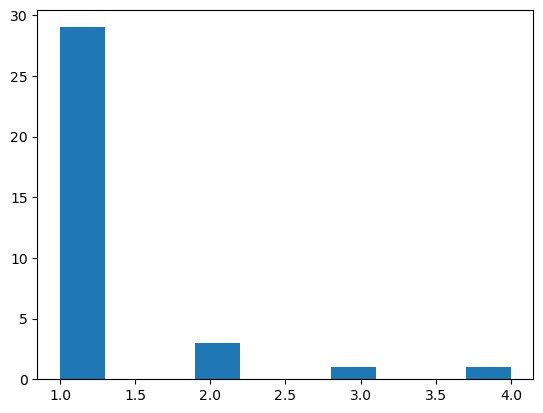

In [8]:
plt.hist(merged[merged['health_sys_id'] != 'Not in a Hospital System']['health_sys_id'].value_counts())

(array([61.,  7.,  5.,  3.,  3.,  1.,  0.,  3.,  0.,  1.]),
 array([  0. ,  10.2,  20.4,  30.6,  40.8,  51. ,  61.2,  71.4,  81.6,
         91.8, 102. ]),
 <BarContainer object of 10 artists>)

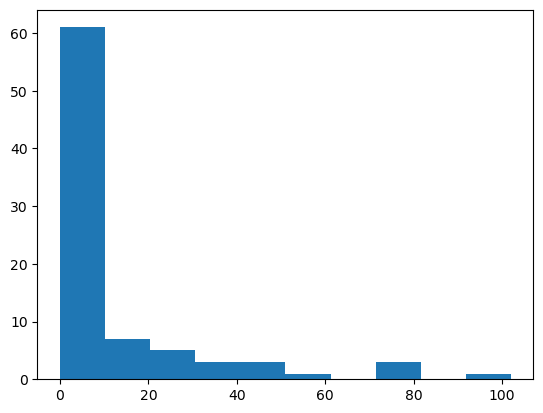

In [9]:
plt.hist(merged['health_system_size'])

/tmp/ipykernel_83726/1374054074.py:15: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(data) or pd.api.types.is_object_dtype(data):


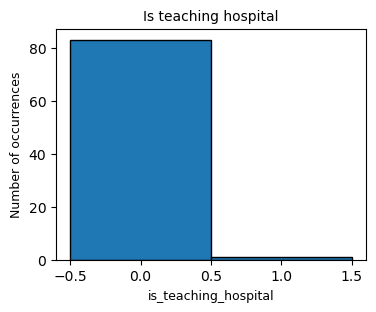

/tmp/ipykernel_83726/1374054074.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(counts.index.astype(str), rotation=45, ha="right")


<Figure size 640x480 with 0 Axes>

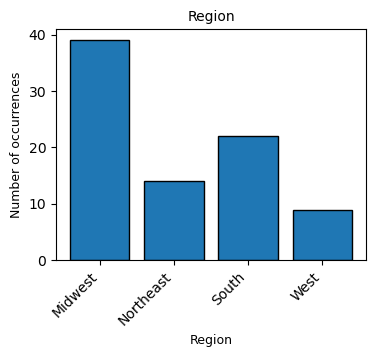

/tmp/ipykernel_83726/1374054074.py:15: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(data) or pd.api.types.is_object_dtype(data):


<Figure size 640x480 with 0 Axes>

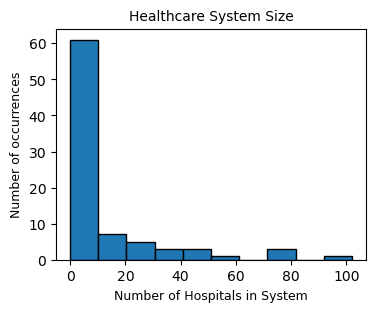

<Figure size 640x480 with 0 Axes>

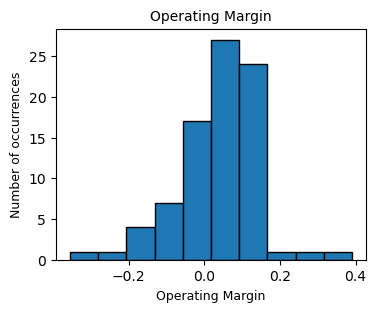

/tmp/ipykernel_83726/1374054074.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(counts.index.astype(str), rotation=45, ha="right")
/tmp/ipykernel_83726/1374054074.py:15: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(data) or pd.api.types.is_object_dtype(data):


<Figure size 640x480 with 0 Axes>

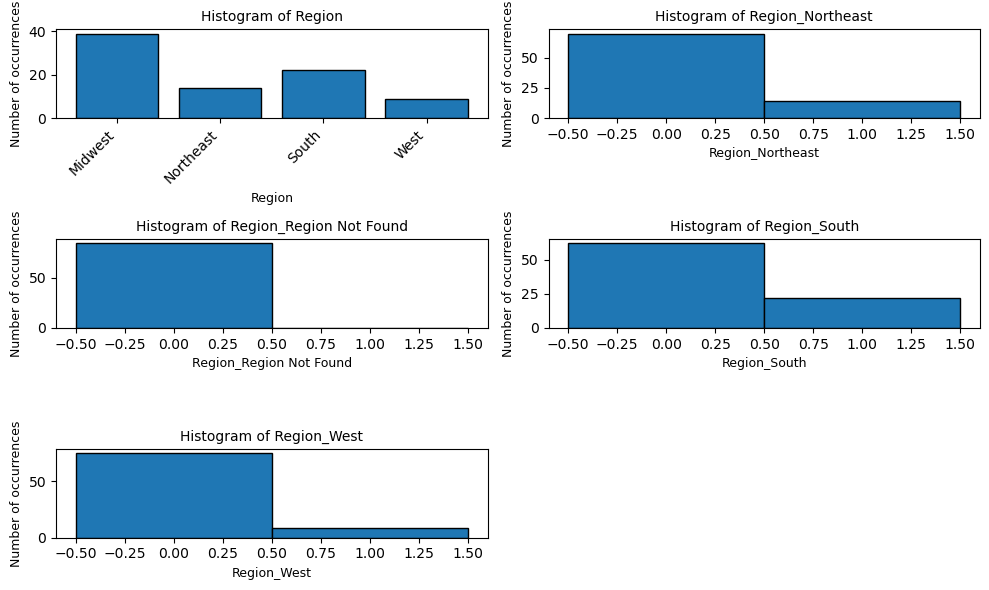

<Figure size 640x480 with 0 Axes>

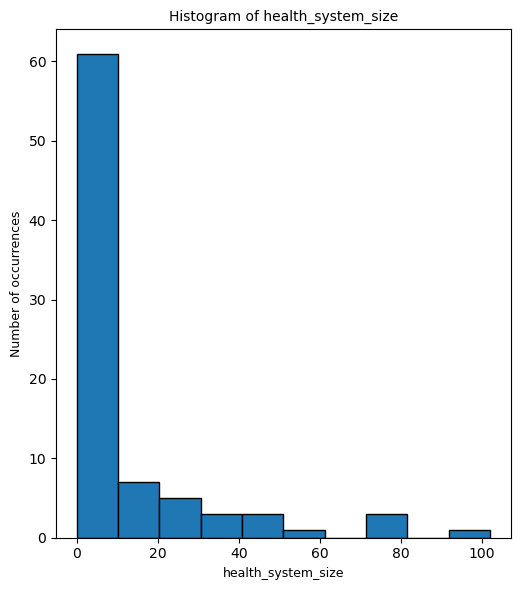

<Figure size 640x480 with 0 Axes>

In [10]:
import math
import matplotlib.pyplot as plt
import numpy as np


def plot_hist(ax, series, title=None, xlabel=None, ylabel="Number of occurrences", bins=None, color=None):
    """
    Draw a histogram or bar plot for a pandas Series.
    - Numeric: histogram (with smart binning for binary/integers).
    - Categorical/string: bar chart from value_counts.
    """
    data = series.dropna()

    # Handle categorical / string columns
    if pd.api.types.is_categorical_dtype(data) or pd.api.types.is_object_dtype(data):
        counts = data.value_counts().sort_index()
        ax.bar(counts.index.astype(str), counts.values, color=color, edgecolor="black")
        ax.set_xticklabels(counts.index.astype(str), rotation=45, ha="right")
    else:
        if bins is None:
            uniq = np.unique(data)
            if set(uniq).issubset({0, 1}):
                bins = [-0.5, 0.5, 1.5]
            elif len(uniq) <= 10 and np.all(np.equal(np.mod(uniq, 1), 0)):
                minv, maxv = int(np.nanmin(uniq)), int(np.nanmax(uniq))
                bins = np.arange(minv - 0.5, maxv + 1.5, 1.0)
            else:
                bins = 10
        ax.hist(data, bins=bins, edgecolor="black", color=color)

    if title:
        ax.set_title(title, fontsize=10)
    if xlabel:
        ax.set_xlabel(xlabel, fontsize=9)
    ax.set_ylabel(ylabel, fontsize=9)
    
def plot_grid(df, cols, ncols=2, figsize=None, sharex=False, sharey=False, color=None):
    """
    Plot a grid of histograms for columns in `cols` (list of column names).
    ncols = number of columns in the grid.
    """
    if len(cols) == 0:
        raise ValueError("No columns to plot")

    n = len(cols)
    nrows = math.ceil(n / ncols)
    if figsize is None:
        figsize = (5 * ncols, 3.5 * nrows)

    fig, axes = plt.subplots(nrows, ncols, figsize=figsize, squeeze=False,
                             sharex=sharex, sharey=sharey)
    axes_flat = axes.flatten()

    for ax in axes_flat[n:]:
        ax.set_visible(False)

    for ax, col in zip(axes_flat, cols):
        title = f"Histogram of {col}"
        # pick bins for dummies automatically in plot_hist
        plot_hist(ax, df[col], title=title, xlabel=col, color=color)

    plt.tight_layout()
    return fig, axes


# --- Usage examples ---

# 1) Single plot for binary 'is_teaching_hospital'
fig, ax = plt.subplots(figsize=(4,3))
plot_hist(ax, merged['is_teaching_hospital'].astype(float), title='Is teaching hospital', xlabel='is_teaching_hospital')
plt.show()
plt.savefig(f"EDA/Is teaching hospital histogram - tax year {TAX_YEAR}")

fig, ax = plt.subplots(figsize=(4,3))
plot_hist(ax, merged['Region'], title='Region', xlabel='Region')
plt.show()
plt.savefig(f"EDA/Region histogram - tax year {TAX_YEAR}")

fig, ax = plt.subplots(figsize=(4,3))
plot_hist(ax, merged['health_system_size'], 
          title='Healthcare System Size', 
          xlabel='Number of Hospitals in System')
plt.show()
plt.savefig(f"EDA/Healthcare system size - tax year {TAX_YEAR}")

fig, ax = plt.subplots(figsize=(4,3))
plot_hist(ax, merged['Operating Margin'], 
          title='Operating Margin', 
          xlabel='Operating Margin')
plt.show()
plt.savefig(f"EDA/Operating Revenue - tax year {TAX_YEAR}")

# 2) Region dummy columns (detect robustly)
region_cols = [c for c in merged.columns if c.startswith('Region') or 'Region_' in c or c.startswith('Region_')]
# # If you used get_dummies on column named 'Region', pandas usually creates 'Region_<value>' or 'Region_<value>' (exact varies).
# # The above tries to catch typical variants.
if region_cols:
    fig, axes = plot_grid(merged, sorted(region_cols), ncols=2, figsize=(10, 6))
    plt.show()
    plt.savefig(f"EDA/Region cols grid - tax year {TAX_YEAR}")
else:
    print("No region columns found; check column names with: ", [c for c in merged.columns if 'Region' in c])


# # 3) Health system size dummy columns
# detect columns produced by get_dummies for health system size — they often start with 'health_system_size' or include that substring
health_sys_cols = [c for c in merged.columns if c.startswith('health_system_size') or 'health_system_size' in c]
if health_sys_cols:
    fig, axes = plot_grid(merged, sorted(health_sys_cols), ncols=2, figsize=(10, 4 + 2*math.ceil(len(health_sys_cols)/2)))
    plt.show()
    plt.savefig(f"EDA/Healthcare system size grid - tax year {TAX_YEAR}")
else:
    print("No health system size dummy columns found; inspect merged.columns for patterns.")


## Outliers

In [11]:
merged.sort_values(by = 'incentive_perc', ascending=False)[['Facility ID', 'Facility Name', 'EIN', 'incentive_perc']]

,Facility ID,Facility ID,Facility Name,Facility Name,EIN,incentive_perc
18,170068,170068,SOUTHWEST MEDICAL CENTER,SOUTHWEST MEDICAL CENTER,480684878,0.462093
36,250067,250067,CLAY COUNTY MEDICAL CORPORATION,CLAY COUNTY MEDICAL CORPORATION,640668465,0.333056
19,170109,170109,MIAMI COUNTY MEDICAL CENTER,MIAMI COUNTY MEDICAL CENTER,481155548,0.299637
57,360096,360096,EAST LIVERPOOL CITY HOSPITAL,EAST LIVERPOOL CITY HOSPITAL,340714583,0.237763
25,190118,190118,DESOTO REGIONAL HEALTH SYSTEM,DESOTO REGIONAL HEALTH SYSTEM,720500565,0.236757
...,...,...,...,...,...,...
41,271316,271316,FRANCES MAHON DEACONESS HOSPITAL,FRANCES MAHON DEACONESS HOSPITAL,810231786,0.000000
1,110135,110135,TAYLOR REGIONAL HOSPITAL,TAYLOR REGIONAL HOSPITAL,580655369,0.000000
44,271345,271345,CENTRAL MONTANA MEDICAL CENTER,CENTRAL MONTANA MEDICAL CENTER,237169043,0.000000
48,291309,291309,BOULDER CITY HOSPITAL,BOULDER CITY HOSPITAL,880065829,0.000000


# 6. Run Models

{'num_samples': 38, 'x': 'incentive_perc', 'y': 'Overall Linear Mean HCAHPS Hospital Rating', 'slope': -6.859418749987821, 'intercept': 89.59586320264215, 'p': 0.34542835767981184, 'std_err': 7.174823215607839}
not enough samples for incentive_perc vs CABG Death Rate Score
{'num_samples': 35, 'x': 'incentive_perc', 'y': 'COPD Death Rate Score', 'slope': 0.7652846392727676, 'intercept': 8.637479707248913, 'p': 0.5867325398078865, 'std_err': 1.394077966923334}
not enough samples for incentive_perc vs Heart Attack Death Rate Score
{'num_samples': 44, 'x': 'incentive_perc', 'y': 'Heart Failure Death Rate Score', 'slope': -0.1351904510112443, 'intercept': 12.155829221843522, 'p': 0.9542735839163083, 'std_err': 2.3436219011722983}
{'num_samples': 7, 'x': 'incentive_perc', 'y': 'Stroke Death Rate Score', 'slope': -4.046003508882263, 'intercept': 15.298127333574369, 'p': 0.384959220682344, 'std_err': 4.251397954976282}
{'num_samples': 11, 'x': 'incentive_perc', 'y': 'Rate of Complications of H

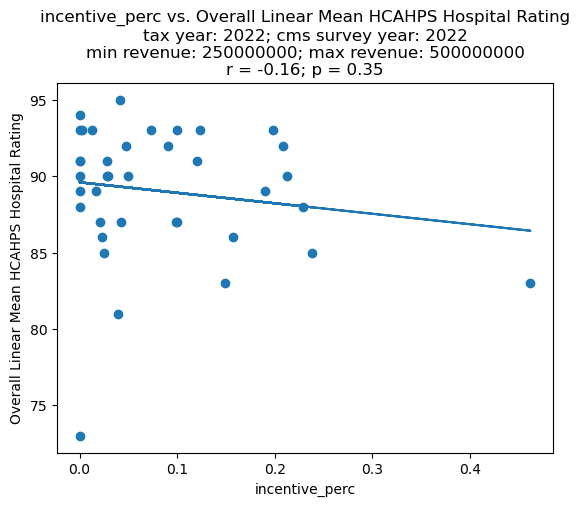

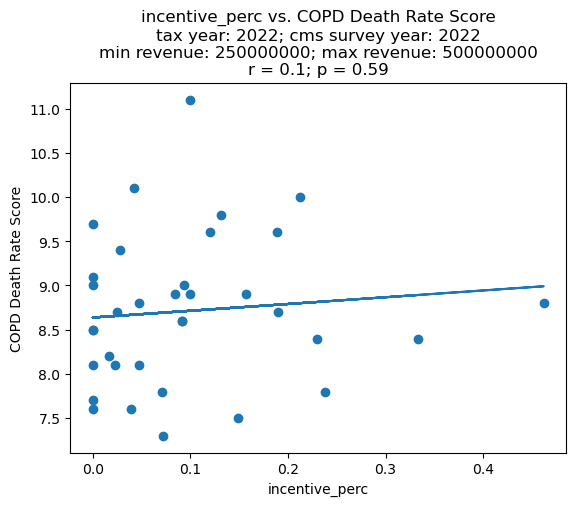

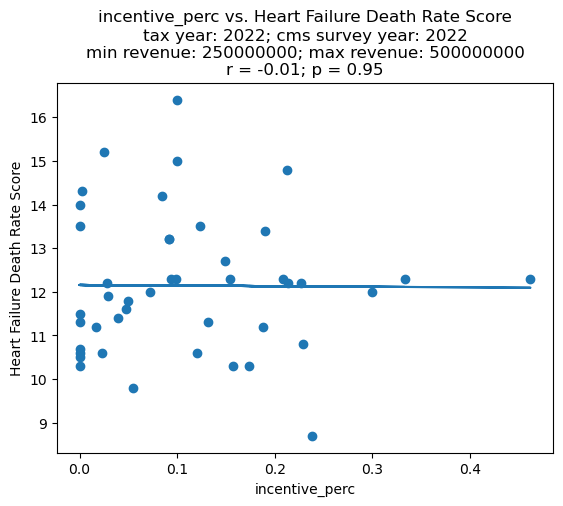

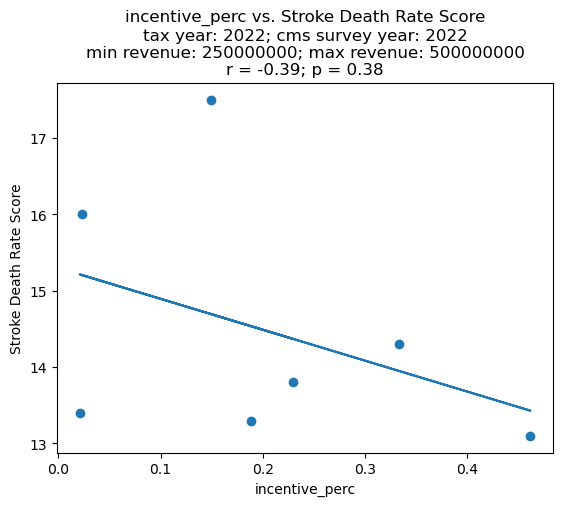

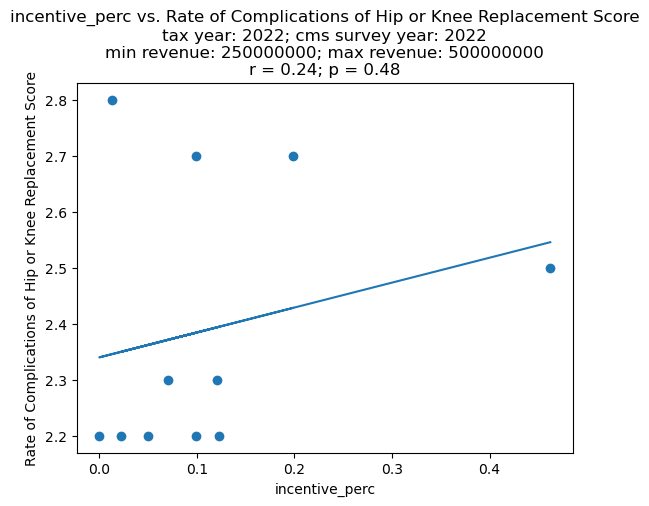

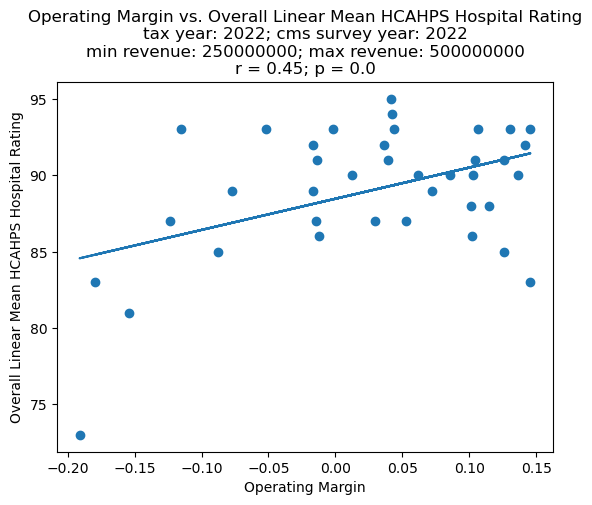

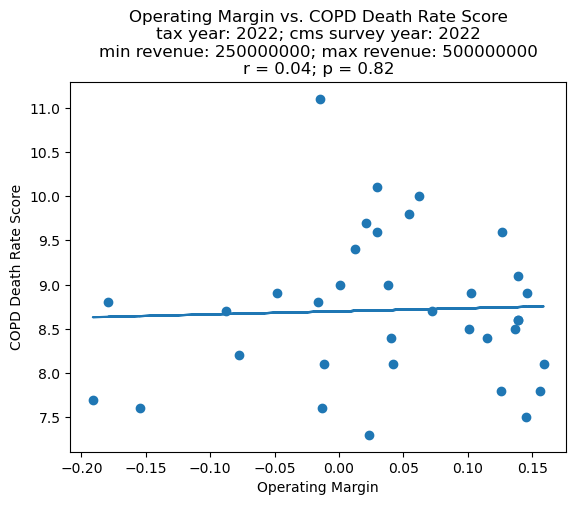

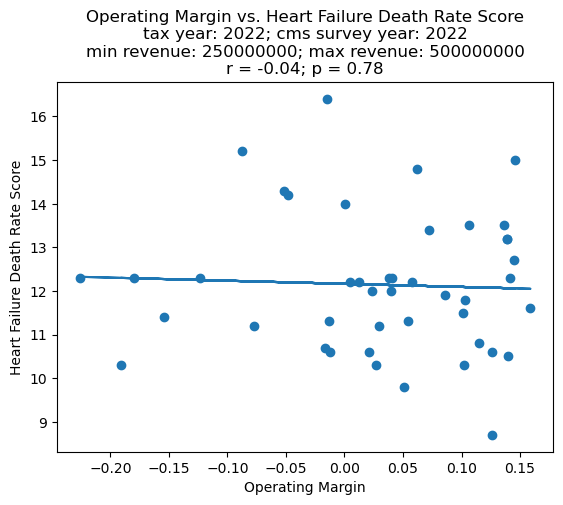

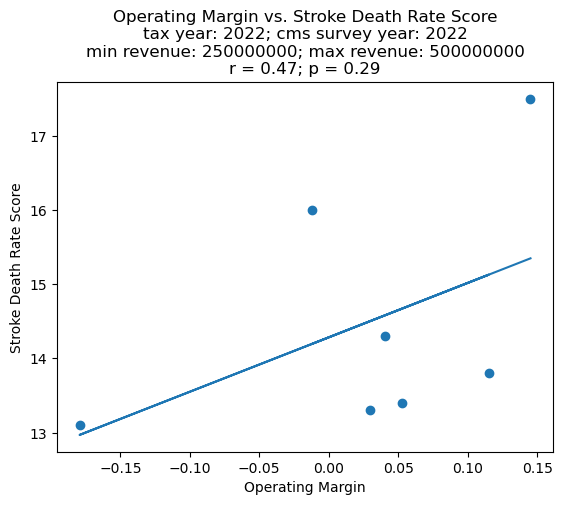

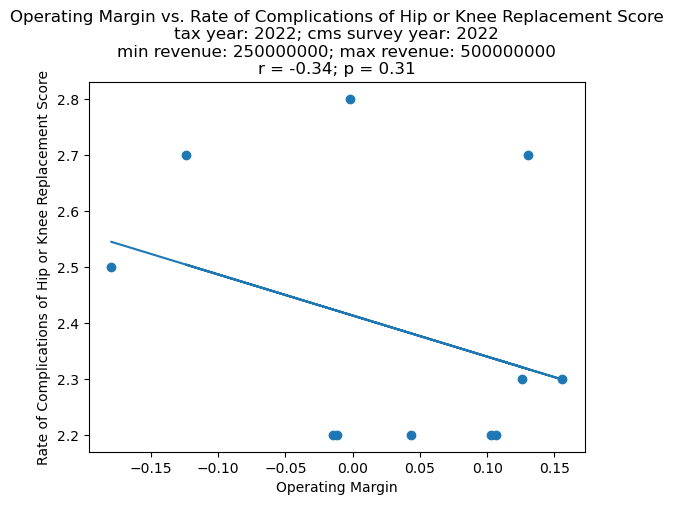

In [12]:
from scipy import stats
def plot_results(x_col,
                 y_col,
                 merged,
                 year,
                 min_rev,
                 max_rev):

    merged = merged[[x_col, y_col]].dropna()

    if len(merged) < 5:
        print(f"not enough samples for {x_col} vs {y_col}")
        return []
        
    x = merged[x_col]
    y = merged[y_col]

    fig_id = f"{x_col}_vs_{y_col}_year={year}_cmsYear={2022}_minRev={min_rev}_maxRev={max_rev}"
    
    m, b, r, p, std_err = stats.linregress(x, y)

    fig = plt.subplots()
    
    plt.scatter(x, y)
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(f'{x_col} vs. {y_col}\n' +\
              f'tax year: {year}; cms survey year: 2022\n' +\
              f'min revenue: {min_rev}; max revenue: {max_rev}\n' +\
              f"r = {round(r, 2)}; p = {round(p, 2)}")
    plt.plot(x, list(map(lambda x: (m * x) + b, x)))
    results = {
        'num_samples': len(merged),
        'x': x_col,
        'y': y_col,
        'slope': m,
        'intercept': b,
        'p': p,
        'std_err': std_err,
    }

    print(results)
    plt.savefig(f"results/{fig_id}.png")

    return results

recs = []
for dep_var in [
    'Overall Linear Mean HCAHPS Hospital Rating',
    'CABG Death Rate Score',
    'COPD Death Rate Score',
    'Heart Attack Death Rate Score',
    'Heart Failure Death Rate Score',
    'Stroke Death Rate Score',
    'Rate of Complications of Hip or Knee Replacement Score'
]:
    r = plot_results('incentive_perc', dep_var, merged, TAX_YEAR, MIN_HOSPITAL_REV, MAX_HOSPITAL_REV)
    if len(r) > 0:
        recs.append(r)
recs = pd.DataFrame(recs)
recs.to_csv(f"results/linreg_results_x=incentive_perc_year={TAX_YEAR}.csv")


recs = []
for dep_var in [
    'Overall Linear Mean HCAHPS Hospital Rating',
    'CABG Death Rate Score',
    'COPD Death Rate Score',
    'Heart Attack Death Rate Score',
    'Heart Failure Death Rate Score',
    'Stroke Death Rate Score',
    'Rate of Complications of Hip or Knee Replacement Score'
]:
    r = plot_results('Operating Margin', dep_var, merged, TAX_YEAR, MIN_HOSPITAL_REV, MAX_HOSPITAL_REV)
    if len(r) > 0:
        recs.append(r)
recs = pd.DataFrame(recs)
recs.to_csv(f"results/linreg_results_x=operating_margin_year={TAX_YEAR}.csv")

In [13]:

import statsmodels.api as sm

df_model = merged[['is_teaching_hospital',
                   'Number of Beds',
                   'incentive_perc',
                   'Region_Northeast',
                   'Region_Region Not Found',
                   'Region_South',
                   'Region_West',
                   'health_system_size',
                   'Operating Margin',
                   'Overall Linear Mean HCAHPS Hospital Rating']].dropna()
X = df_model[[
    'is_teaching_hospital',
    'Number of Beds',
    'incentive_perc',
    'Region_Northeast',
    'Region_Region Not Found',
    'Region_South',
    'Region_West',
    'Operating Margin',
    'health_system_size',
]]
X = sm.add_constant(X)

Y = df_model['Overall Linear Mean HCAHPS Hospital Rating']

model = sm.OLS(Y, X)
results = model.fit()

with open(f"results/ols_y=mean_hcahps_hospital_rating_year={TAX_YEAR}_cmsYear={2022}_minRev={MIN_HOSPITAL_REV}_maxRev={MAX_HOSPITAL_REV}.txt", "w") as f:
    f.write(results.summary().as_text())
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        OLS Regression Results                                        
======================================================================================================
Dep. Variable:     Overall Linear Mean HCAHPS Hospital Rating   R-squared:                       0.629
Model:                                                    OLS   Adj. R-squared:                  0.527
Method:                                         Least Squares   F-statistic:                     6.145
Date:                                        Sun, 21 Sep 2025   Prob (F-statistic):           0.000119
Time:                                                19:42:28   Log-Likelihood:                -89.914
No. Observations:                                          38   AIC:                             197.8
Df Residuals:                                              29   BIC:                             212.6
Df Model:                                                   8                                         
Covariance Type:                                    nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      94.3371      1.337     70.536      0.000      91.602      97.072
is_teaching_hospital        7.6453      4.110      1.860      0.073      -0.760      16.051
Number of Beds             -0.1342      0.028     -4.800      0.000      -0.191      -0.077
incentive_perc             -5.0194      5.519     -0.910      0.371     -16.306       6.268
Region_Northeast           -1.7061      1.511     -1.129      0.268      -4.796       1.383
Region_Region Not Found  2.491e-14   1.46e-14      1.712      0.098   -4.85e-15    5.47e-14
Region_South               -0.0454      1.225     -0.037      0.971      -2.552       2.461
Region_West                -2.7088      1.814     -1.494      0.146      -6.418       1.001
Operating Margin           13.5725      6.429      2.111      0.043       0.424      26.720
health_system_size         -0.0430      0.030     -1.447      0.159      -0.104       0.018
==============================================================================
Omnibus:                        2.467   Durbin-Watson:                   2.211
Prob(Omnibus):                  0.291   Jarque-Bera (JB):                1.709
Skew:                          -0.515   Prob(JB):                        0.425
Kurtosis:                       3.129   Cond. No.                     5.69e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.13e-33. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [14]:
merged.columns

Index(['Facility ID', 'Facility ID', 'Facility Name', 'Facility Name',
       'Region', 'health_sys_id', 'health_system_size', 'EIN',
       'is_teaching_hospital', 'incentive_perc', 'Number of Beds',
       'Operating Margin', 'Overall Linear Mean HCAHPS Hospital Rating',
       'CABG Death Rate Score', 'COPD Death Rate Score',
       'Heart Attack Death Rate Score', 'Heart Failure Death Rate Score',
       'Stroke Death Rate Score',
       'Rate of Complications of Hip or Knee Replacement Score',
       'Region_Northeast', 'Region_Region Not Found', 'Region_South',
       'Region_West'],
      dtype='object')

In [15]:

df_model = merged[['is_teaching_hospital',
                   'Number of Beds',
                   'incentive_perc',
                   'Region_Northeast',
                   'Region_Region Not Found',
                   'Region_South',
                   'Region_West',
                   'health_system_size',
                   'Operating Margin',
                   'Heart Failure Death Rate Score']].dropna()
X = df_model[[
    'is_teaching_hospital',
    'Number of Beds',
    'incentive_perc',
    'Region_Northeast',
    'Region_Region Not Found',
    'Region_South',
    'Region_West',
    'Operating Margin',
    'health_system_size',
]]
X = sm.add_constant(X)

Y = df_model['Heart Failure Death Rate Score']

model = sm.OLS(Y, X)
results = model.fit()

with open(f"results/ols_y=heart_failure_death_rate_score_year={TAX_YEAR}_cmsYear={2022}_minRev={MIN_HOSPITAL_REV}_maxRev={MAX_HOSPITAL_REV}.txt", "w") as f:
    f.write(results.summary().as_text())
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                  OLS Regression Results                                  
==========================================================================================
Dep. Variable:     Heart Failure Death Rate Score   R-squared:                       0.153
Model:                                        OLS   Adj. R-squared:                 -0.041
Method:                             Least Squares   F-statistic:                    0.7890
Date:                            Sun, 21 Sep 2025   Prob (F-statistic):              0.616
Time:                                    19:42:28   Log-Likelihood:                -78.728
No. Observations:                              44   AIC:                             175.5
Df Residuals:                                  35   BIC:                             191.5
Df Model:                                       8                                         
Covariance Type:                        nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      12.6875      0.733     17.308      0.000      11.199      14.176
is_teaching_hospital       -3.1859      2.363     -1.348      0.186      -7.982       1.611
Number of Beds             -0.0083      0.015     -0.558      0.580      -0.039       0.022
incentive_perc              0.4079      2.613      0.156      0.877      -4.896       5.712
Region_Northeast           -0.4155      0.764     -0.544      0.590      -1.966       1.135
Region_Region Not Found  7.789e-15   1.44e-14      0.539      0.593   -2.15e-14    3.71e-14
Region_South               -0.6213      0.637     -0.976      0.336      -1.914       0.671
Region_West                 0.0305      1.072      0.028      0.977      -2.145       2.206
Operating Margin           -0.3726      3.068     -0.121      0.904      -6.600       5.855
health_system_size          0.0025      0.025      0.102      0.919      -0.047       0.052
==============================================================================
Omnibus:                        8.963   Durbin-Watson:                   1.651
Prob(Omnibus):                  0.011   Jarque-Bera (JB):                8.023
Skew:                           0.913   Prob(JB):                       0.0181
Kurtosis:                       4.021   Cond. No.                     1.82e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.21e-32. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""